In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
from sklearn.model_selection import KFold
from mlxtend.feature_selection import ExhaustiveFeatureSelector as efs
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from pandas_profiling import ProfileReport
np.random.seed(0)

In [69]:
data = pd.read_csv("Boston_Data.csv")

# İlk olarak veri setimizi anlamak için birkaç komut ile gözlemleme yapıyoruz.

In [70]:
data.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [71]:
# Nimet gibi bir pandas keşifçi veri analizi toolu/ (merak ederseniz) indirmek için: "pip install pandas-profiling"
profile = ProfileReport(data, title="Pandas Profiling Report")
profile

In [7]:
#Datamızı target ve predictor olarak ikiye ayırıyoruz.
X = data.drop("crim", axis=1)
X

,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


In [8]:
y = data["crim"]
y

0      0.00632
1      0.02731
2      0.02729
3      0.03237
4      0.06905
        ...   
501    0.06263
502    0.04527
503    0.06076
504    0.10959
505    0.04741
Name: crim, Length: 506, dtype: float64

In [9]:
# Data'mızın bir kısmı ile train edip bir kısmı ile test etmek istediğimzden datamızı train 
# ve test olarak ikiye ayırıyoruz. 
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.20, random_state=1)

# Ham datamız üzerinde linear regresyon uygulayıp score'lara bakıyoruz. Daha doğru değerlere ulaşmak için Cross-Validation yönetimini kullanıyoruz.

In [13]:
lr_reg_cv = LinearRegression()


folds = KFold(n_splits = 10, shuffle = True, random_state = 1)
scores = cross_val_score(lr_reg_cv, X_train, y_train, scoring='neg_mean_squared_error', cv=folds)
print("The 10 scores are: ",scores)
average_scores = np.average(scores)
print("The average of score is: ", average_scores)

The 10 scores are:  [ -26.13703644  -15.31533884  -12.38091194   -8.42289796  -85.08215802
  -14.47749786  -97.07050526  -17.62984709  -47.77326308 -190.01573516]
The average of score is:  -51.43051916596362


In [14]:
lr_reg = LinearRegression()

lr_reg.fit(X_train, y_train)
y_pred_test = lr_reg.predict(X_test)
y_pred_train = lr_reg.predict(X_train)
mse_train = mean_squared_error(y_pred_train, y_train)
mse_test = mean_squared_error(y_pred_test,y_test)
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
print('mse for train set: ', mse_train)
print('mse for test set: ', mse_test)
print('r2 score for train set: ', r2_train)
print('r2 score for test set: ', r2_test)

mse for train set:  46.680505966439185
mse for test set:  16.196205796382003
r2 score for train set:  0.4406560463003085
r2 score for test set:  0.5452700709751327


# Feature selecting ile modelimizde kullanmak istediğimiz predictorları seçeceğiz

In [335]:
#önce exhaustive feature selection yöntemi ile best subset oluşturacağız.
# bu yöntem olası tüm dizilimleri uygular.
model = LinearRegression()
efs=efs(model,
    min_features=1,
    max_features=13,
    scoring='neg_mean_squared_error',
    cv=10,
    print_progress=True)

feature_names=('zn','indus','chas','nox','rm','age','dis','rad','tax','ptratio',
               'black','lstat','medv')
efs.fit(X_train,y_train, custom_feature_names=feature_names)

print('Best mse score: %.2f' % efs.best_score_)
print('Best subset (indices):', efs.best_idx_)
print('Best subset (corresponding names):', efs.best_feature_names_)

Features: 8191/8191

Best mse score: -48.32
Best subset (indices): (0, 2, 3, 6, 7, 8, 9, 12)
Best subset (corresponding names): ('zn', 'chas', 'nox', 'dis', 'rad', 'tax', 'ptratio', 'medv')


In [336]:
pd.DataFrame.from_dict(efs.get_metric_dict()).T.sort_values('avg_score',ascending=False)

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
6380,"(0, 2, 3, 6, 7, 8, 9, 12)","[-139.85952406899455, -12.709284678810318, -16...",-48.3228,"(zn, chas, nox, dis, rad, tax, ptratio, medv)",30.2307,40.7031,13.5677
4916,"(0, 3, 6, 7, 8, 9, 12)","[-139.8675812544425, -13.075601919412787, -16....",-48.3326,"(zn, nox, dis, rad, tax, ptratio, medv)",30.253,40.7331,13.5777
7205,"(0, 1, 2, 3, 6, 7, 8, 9, 12)","[-139.84180194809602, -12.737932685703916, -16...",-48.3534,"(zn, indus, chas, nox, dis, rad, tax, ptratio,...",30.2127,40.6788,13.5596
6170,"(0, 1, 3, 6, 7, 8, 9, 12)","[-139.8259390836548, -13.084181242439403, -16....",-48.3547,"(zn, indus, nox, dis, rad, tax, ptratio, medv)",30.2265,40.6974,13.5658
7486,"(0, 2, 3, 5, 6, 7, 8, 9, 12)","[-140.09547442345828, -12.881276867227392, -16...",-48.3557,"(zn, chas, nox, age, dis, rad, tax, ptratio, m...",30.2583,40.7403,13.5801
...,...,...,...,...,...,...,...
14,"(0, 2)","[-189.6696118187861, -23.25205841149181, -24.8...",-80.2986,"(zn, chas)",42.6361,57.406,19.1353
37,"(2, 4)","[-200.54447731731125, -28.62335935784065, -24....",-80.3289,"(chas, rm)",43.2879,58.2835,19.4278
4,"(4,)","[-201.13085866907954, -28.525013531807673, -23...",-80.3754,"(rm,)",43.604,58.7091,19.5697
0,"(0,)","[-190.05876699522682, -24.066305550010767, -23...",-80.593,"(zn,)",43.0231,57.9269,19.309


In [337]:
#ikinci olarak sfs yönetimi uyguluyoruz. 0 feature ile başlayıp tamamını dahil edene kadar devam edip sonuçları kıyaslar.
sfs=sfs(model,
        k_features=13,
        forward=True,
        verbose=2,
        scoring='neg_mean_squared_error',
        cv=10)
feature_names=('zn','indus','chas','nox','rm','age','dis','rad','tax','ptratio',
               'black','lstat','medv')
sfs.fit(X_train, y_train, custom_feature_names=feature_names)
sfs.subsets_

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  13 out of  13 | elapsed:    0.1s finished

[2021-01-03 16:47:45] Features: 1/13 -- score: -52.919485391834144[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.1s finished

[2021-01-03 16:47:45] Features: 2/13 -- score: -50.433258495706994[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  11 out of  11 | elapsed:    0.1s finished

[2021-01-03 16:47:45] Features: 3/13 -- score: -50.1776902776726[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 

{1: {'feature_idx': (7,),
  'cv_scores': array([-148.23170938,  -12.75734568,  -18.40682955,  -52.26701296,
         -108.41195793,  -26.70506118,  -36.27482954,   -6.18382226,
          -87.00295214,  -32.95333329]),
  'avg_score': -52.919485391834144,
  'feature_names': ('rad',)},
 2: {'feature_idx': (7, 11),
  'cv_scores': array([-149.75678208,  -10.25436958,  -15.83589218,  -56.01640094,
         -103.49910767,  -24.88541076,  -28.20530641,   -5.87779877,
          -81.72724638,  -28.27427019]),
  'avg_score': -50.433258495706994,
  'feature_names': ('rad', 'lstat')},
 3: {'feature_idx': (0, 7, 11),
  'cv_scores': array([-149.96543402,  -10.16762155,  -16.06953182,  -55.75300673,
         -103.3069299 ,  -24.5881179 ,  -27.22003833,   -5.99553947,
          -81.10520759,  -27.60547547]),
  'avg_score': -50.1776902776726,
  'feature_names': ('zn', 'rad', 'lstat')},
 4: {'feature_idx': (0, 6, 7, 11),
  'cv_scores': array([-148.88679056,  -10.0170678 ,  -15.35021888,  -54.66098945,
  

In [338]:
pd.DataFrame.from_dict(sfs.get_metric_dict()).T.sort_values('avg_score',ascending=False) 

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
9,"(0, 2, 3, 6, 7, 8, 9, 11, 12)","[-142.89219701243732, -11.86162920425178, -16....",-48.3588,"(zn, chas, nox, dis, rad, tax, ptratio, lstat,...",31.086,41.8547,13.9516
8,"(0, 3, 6, 7, 8, 9, 11, 12)","[-142.84768624322953, -12.256831898287734, -15...",-48.3776,"(zn, nox, dis, rad, tax, ptratio, lstat, medv)",31.0991,41.8723,13.9574
10,"(0, 1, 2, 3, 6, 7, 8, 9, 11, 12)","[-143.05612234487566, -11.857295441653935, -15...",-48.3801,"(zn, indus, chas, nox, dis, rad, tax, ptratio,...",31.1058,41.8813,13.9604
7,"(0, 3, 6, 7, 9, 11, 12)","[-143.06734818299077, -11.626620660034561, -15...",-48.4078,"(zn, nox, dis, rad, ptratio, lstat, medv)",31.2396,42.0615,14.0205
11,"(0, 1, 2, 3, 5, 6, 7, 8, 9, 11, 12)","[-143.05994062663078, -11.951132075192671, -16...",-48.4867,"(zn, indus, chas, nox, age, dis, rad, tax, ptr...",31.0984,41.8714,13.9571
6,"(0, 3, 6, 7, 11, 12)","[-144.06793850852267, -11.702810511493247, -15...",-48.7882,"(zn, nox, dis, rad, lstat, medv)",31.4536,42.3497,14.1166
12,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12)","[-143.93908726950318, -11.997627368305539, -16...",-48.9607,"(zn, indus, chas, nox, rm, age, dis, rad, tax,...",31.1463,41.9358,13.9786
5,"(0, 6, 7, 11, 12)","[-145.59140746518085, -11.690339832417052, -16...",-49.3689,"(zn, dis, rad, lstat, medv)",31.6358,42.5949,14.1983
4,"(0, 6, 7, 11)","[-148.88679055857781, -10.017067799494875, -15...",-49.8387,"(zn, dis, rad, lstat)",33.0076,44.4419,14.814
13,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)","[-154.95187494316338, -11.608370898157235, -15...",-49.9936,"(zn, indus, chas, nox, rm, age, dis, rad, tax,...",33.211,44.7158,14.9053


In [339]:
#sfs ile tek farkı tüm feature'lar ile başlayıp en aza kadar inmesidir.
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
sbs=sfs(model,
        k_features=1,
        forward=False,
        verbose=1,
        scoring='neg_mean_squared_error',
        cv=10)
feature_names=('zn','indus','chas','nox','rm','age','dis','rad','tax','ptratio',
               'black','lstat','medv')
sbs.fit(X_train, y_train, custom_feature_names=feature_names)
sbs.subsets_

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  13 out of  13 | elapsed:    0.2s finished
Features: 12/1[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.1s finished
Features: 11/1[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  11 out of  11 | elapsed:    0.1s finished
Features: 10/1[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.1s finished
Features: 9/1[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s finished
Features: 8/1[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s finished
Features: 7/1[Parallel(n_j

{13: {'feature_idx': (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12),
  'cv_scores': array([-154.95187494,  -11.6083709 ,  -15.19559565,  -52.21030216,
          -97.23408268,  -24.64270524,  -27.23153206,  -11.13027239,
          -79.04068554,  -26.69084432]),
  'avg_score': -49.99362658755446,
  'feature_names': ('zn',
   'indus',
   'chas',
   'nox',
   'rm',
   'age',
   'dis',
   'rad',
   'tax',
   'ptratio',
   'black',
   'lstat',
   'medv')},
 12: {'feature_idx': (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12),
  'cv_scores': array([-143.93908727,  -11.99762737,  -16.12275983,  -53.31475648,
          -97.46546983,  -23.38606535,  -28.36088408,  -10.88997491,
          -76.57948907,  -27.55052138]),
  'avg_score': -48.96066355720258,
  'feature_names': ('zn',
   'indus',
   'chas',
   'nox',
   'rm',
   'age',
   'dis',
   'rad',
   'tax',
   'ptratio',
   'lstat',
   'medv')},
 11: {'feature_idx': (0, 1, 2, 3, 5, 6, 7, 8, 9, 11, 12),
  'cv_scores': array([-143.05994063,  -11.95113208,  -16

In [340]:
pd.DataFrame.from_dict(sbs.get_metric_dict()).T.sort_values('avg_score',ascending=False)

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
8,"(0, 2, 3, 6, 7, 8, 9, 12)","[-139.85952406899455, -12.709284678810318, -16...",-48.3228,"(zn, chas, nox, dis, rad, tax, ptratio, medv)",30.2307,40.7031,13.5677
7,"(0, 3, 6, 7, 8, 9, 12)","[-139.8675812544425, -13.075601919412787, -16....",-48.3326,"(zn, nox, dis, rad, tax, ptratio, medv)",30.253,40.7331,13.5777
9,"(0, 1, 2, 3, 6, 7, 8, 9, 12)","[-139.84180194809602, -12.737932685703916, -16...",-48.3534,"(zn, indus, chas, nox, dis, rad, tax, ptratio,...",30.2127,40.6788,13.5596
6,"(0, 3, 6, 7, 9, 12)","[-140.07544570714018, -12.457604696994059, -16...",-48.3732,"(zn, nox, dis, rad, ptratio, medv)",30.401,40.9324,13.6441
10,"(0, 1, 2, 3, 6, 7, 8, 9, 11, 12)","[-143.05612234487566, -11.857295441653935, -15...",-48.3801,"(zn, indus, chas, nox, dis, rad, tax, ptratio,...",31.1058,41.8813,13.9604
11,"(0, 1, 2, 3, 5, 6, 7, 8, 9, 11, 12)","[-143.05994062663078, -11.951132075192671, -16...",-48.4867,"(zn, indus, chas, nox, age, dis, rad, tax, ptr...",31.0984,41.8714,13.9571
5,"(0, 3, 6, 7, 12)","[-141.14455173908098, -12.702689847091072, -16...",-48.8192,"(zn, nox, dis, rad, medv)",30.6196,41.2267,13.7422
12,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12)","[-143.93908726950318, -11.997627368305539, -16...",-48.9607,"(zn, indus, chas, nox, rm, age, dis, rad, tax,...",31.1463,41.9358,13.9786
4,"(0, 6, 7, 12)","[-142.6118062135307, -12.552213061006173, -16....",-49.2868,"(zn, dis, rad, medv)",30.8997,41.6038,13.8679
13,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)","[-154.95187494316338, -11.608370898157235, -15...",-49.9936,"(zn, indus, chas, nox, rm, age, dis, rad, tax,...",33.211,44.7158,14.9053


#Best subset (indices): (0, 2, 3, 6, 7, 8, 9, 12)
#Best subset (corresponding names): ('zn', 'chas', 'nox', 'dis', 'rad', 'tax', 'ptratio', 'medv')
#Değerlerinin en iyi sonucu verdiğini üç testte de görüyoruz.
#bu değerlerle yeni predictorlarımızı oluşturacağız.

In [15]:
X_train_selected = X_train.iloc[:,[0, 2, 3, 6, 7, 8, 9, 12]]
X_test_selected = X_test.iloc[:,[0, 2, 3, 6, 7, 8, 9, 12]]
X_selected = X.iloc[:,[0, 2, 3, 6, 7, 8, 9, 12]]
model_selected = LinearRegression()
model_selected.fit(X_train_selected, y_train )
y_pred_selected = model_selected.predict(X_test_selected)
r2_selected= r2_score(y_test, y_pred_selected)
mse_selected= mean_squared_error(y_test, y_pred_selected)
print("r2 score for selected test: ", r2_selected)
print("mse score for selected test: ", mse_selected)

r2 score for selected test:  0.511454438240992
mse score for selected test:  17.400623873880182


Cross validation yaparak modelimizin sonuçlarına bakıyoruz

In [22]:
folds = KFold(n_splits = 10, shuffle = True, random_state = 1)
scores = cross_val_score(model_selected, X_train_selected, y_train, scoring='neg_mean_squared_error', cv=folds)
scores   

array([ -24.19639561,  -14.89427751,  -11.64641075,   -8.55166183,
        -83.22209682,  -13.24321953,  -96.05461755,  -18.09211086,
        -43.62480812, -184.29704323])

In [23]:
np.average(scores)


-49.78226418085372

# İlk senaryoda, best sub-set olarak belirlediğimiz değerleri kullanarak ridge ve lasso uygulayacağız.

In [24]:
alphas= 10**np.linspace(5,-2,100)*0.5
alphas

array([5.00000000e+04, 4.24876718e+04, 3.61040451e+04, 3.06795364e+04,
       2.60700414e+04, 2.21531073e+04, 1.88246790e+04, 1.59963357e+04,
       1.35929412e+04, 1.15506485e+04, 9.81520325e+03, 8.34050269e+03,
       7.08737081e+03, 6.02251770e+03, 5.11765511e+03, 4.34874501e+03,
       3.69536102e+03, 3.14014572e+03, 2.66834962e+03, 2.26743925e+03,
       1.92676430e+03, 1.63727458e+03, 1.39127970e+03, 1.18224471e+03,
       1.00461650e+03, 8.53676324e+02, 7.25414389e+02, 6.16423370e+02,
       5.23807876e+02, 4.45107543e+02, 3.78231664e+02, 3.21403656e+02,
       2.73113861e+02, 2.32079442e+02, 1.97210303e+02, 1.67580133e+02,
       1.42401793e+02, 1.21006413e+02, 1.02825615e+02, 8.73764200e+01,
       7.42484131e+01, 6.30928442e+01, 5.36133611e+01, 4.55581378e+01,
       3.87131841e+01, 3.28966612e+01, 2.79540509e+01, 2.37540508e+01,
       2.01850863e+01, 1.71523464e+01, 1.45752653e+01, 1.23853818e+01,
       1.05245207e+01, 8.94324765e+00, 7.59955541e+00, 6.45774833e+00,
      

In [29]:
# verilerimizi standart normal dağılıma uyarlıyoruz.
scaler = preprocessing.StandardScaler()
Xscaled = scaler.fit_transform(X_selected)
X_train_selected_scaled = scaler.fit_transform(X_train_selected)
X_test_selected_scaled = scaler.fit_transform(X_test_selected)


(100, 8)


Text(0, 0.5, 'weights')

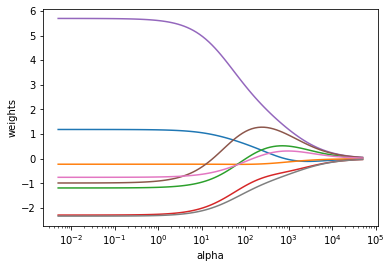

In [31]:
ridge= Ridge()
coeffs= []

for a in alphas:
    ridge.set_params(alpha = a)
    ridge.fit(Xscaled, y)
    #ridge.fit(X_train_selected_scaled,y_train)
    coeffs.append(ridge.coef_)
print(np.shape(coeffs))

ax = plt.gca()
ax.plot(alphas, coeffs)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

In [27]:
# penaltı eklenmemiş haline bakıyoruz.
ridge1=Ridge(alpha=0)
ridge1.fit(X_train_selected_scaled, y_train)
pred1= ridge1.predict(X_test_selected_scaled)
print(pd.Series(ridge1.coef_, index = X_selected.columns))
print(mean_squared_error(y_test, pred1))

zn         1.534764
chas      -0.277790
nox       -1.604970
dis       -2.763722
rad        6.012912
tax       -1.041772
ptratio   -0.870135
medv      -2.663819
dtype: float64
16.574637451166407


In [32]:
# lamdas değerleri üretip alpha yerine tanımlıyoruz ve alpha, error arasında uygun olanı arıyoruz.
lambdas = np.linspace(0.01,100,num=1000)
scoresCV = []
for l in lambdas:
    RidgeReg = Ridge(alpha=l)
    RidgeReg.fit(X_train_selected_scaled, y_train)    
    scoreCV = cross_val_score(RidgeReg, X_train_selected_scaled, y_train, scoring='neg_mean_squared_error',
                             cv=KFold(n_splits=10, shuffle=True,
                                            random_state=1))
    scoresCV.append([l,-1*np.mean(scoreCV)])

df_lambda = pd.DataFrame(scoresCV,columns=['Lambda','Validation Error'])
df_lambda

,Lambda,Validation Error
0,0.01000,49.782090
1,0.11009,49.780390
2,0.21018,49.778776
3,0.31027,49.777245
4,0.41036,49.775796
...,...,...
995,99.59964,51.984932
996,99.69973,51.986710
997,99.79982,51.988487
998,99.89991,51.990263


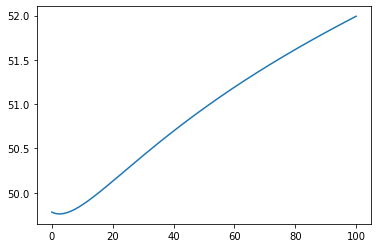

In [33]:
plt.plot(df_lambda.Lambda,df_lambda['Validation Error'])

In [34]:
# Neyse ki bu RidgeCV fonksiyonu sayesinde en iyi alpha değerini hemen bulabiliyoruz.
ridgecv = RidgeCV(alphas = alphas,cv = 10, scoring = 'neg_mean_squared_error')
ridgecv.fit(X_train_selected_scaled, y_train)
ridgecv.alpha_

2.066006200057667

In [40]:
#Bulduğumuz en iyi alpha değeriyle kodumuzu çalıştırıp en iyi skorumuza ve katsayılara bakıyoruz.
ridgeLast=Ridge(alpha=ridgecv.alpha_)
ridgeLast.fit(X_train_selected_scaled, y_train)
predLast= ridgeLast.predict(X_test_selected_scaled)
print(pd.Series(ridgeLast.coef_, index = X_selected.columns))
print("mse for best alpha:",mean_squared_error(y_test, predLast))
#16.30385839860013 en iyi skorumuz.
#ayrıca handi değere ne kadar müdahale edilmiş buradan yorumlayabiliyoruz. 

zn         1.476527
chas      -0.276884
nox       -1.524787
dis       -2.657662
rad        5.765127
tax       -0.808682
ptratio   -0.835411
medv      -2.592749
dtype: float64
mse for best alpha: 16.30385839860013


Text(0, 0.5, 'weights')

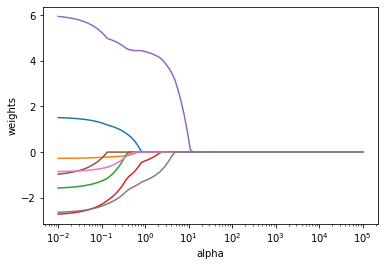

In [44]:
# lasso setine bakıp grafik üzerinden yorumluyoruz.
lasso = Lasso()
coefs = []

for a in alphas:
    lasso.set_params(alpha=a)
    #lasso.fit(scale(X_train_selected_scaled), y_train)
    lasso.fit(X_train_selected_scaled, y_train)
    coefs.append(lasso.coef_)
    
ax = plt.gca()
ax.plot(alphas*2, coefs)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

In [49]:
lassocv = LassoCV(alphas = None, cv = 10)
lassocv.fit(X_train_selected_scaled, y_train)
lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train_selected_scaled, y_train)
print("Mse, when best alpha values occours: ",mean_squared_error(y_test, lasso.predict(X_test_selected_scaled)))
print("Best alpha value: ", lassocv.alpha_)
# en iyi değerimiz 16.44339502886567 oluyor.

Mse, when best alpha values occours:  16.44339502886567
Best alpha value:  0.005984053616517041


In [50]:
pd.Series(lasso.coef_, index=X_selected.columns)

zn         1.503938
chas      -0.272252
nox       -1.565206
dis       -2.706986
rad        5.923572
tax       -0.951655
ptratio   -0.852093
medv      -2.628576
dtype: float64

# Aynı işlemleri başta feature selection yapmadan yapsaydık.

In [51]:
alphas = 10**np.linspace(5,-2,100)*0.5
alphas

array([5.00000000e+04, 4.24876718e+04, 3.61040451e+04, 3.06795364e+04,
       2.60700414e+04, 2.21531073e+04, 1.88246790e+04, 1.59963357e+04,
       1.35929412e+04, 1.15506485e+04, 9.81520325e+03, 8.34050269e+03,
       7.08737081e+03, 6.02251770e+03, 5.11765511e+03, 4.34874501e+03,
       3.69536102e+03, 3.14014572e+03, 2.66834962e+03, 2.26743925e+03,
       1.92676430e+03, 1.63727458e+03, 1.39127970e+03, 1.18224471e+03,
       1.00461650e+03, 8.53676324e+02, 7.25414389e+02, 6.16423370e+02,
       5.23807876e+02, 4.45107543e+02, 3.78231664e+02, 3.21403656e+02,
       2.73113861e+02, 2.32079442e+02, 1.97210303e+02, 1.67580133e+02,
       1.42401793e+02, 1.21006413e+02, 1.02825615e+02, 8.73764200e+01,
       7.42484131e+01, 6.30928442e+01, 5.36133611e+01, 4.55581378e+01,
       3.87131841e+01, 3.28966612e+01, 2.79540509e+01, 2.37540508e+01,
       2.01850863e+01, 1.71523464e+01, 1.45752653e+01, 1.23853818e+01,
       1.05245207e+01, 8.94324765e+00, 7.59955541e+00, 6.45774833e+00,
      

In [52]:
scaler = preprocessing.StandardScaler()
Xscaled = scaler.fit_transform(X)


(100, 13)


Text(0, 0.5, 'weights')

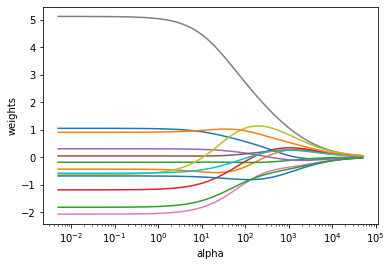

In [53]:
ridge = Ridge()
coefs = []

for a in alphas:
    ridge.set_params(alpha = a)
    ridge.fit(Xscaled, y)
    coefs.append(ridge.coef_)
print(np.shape(coefs))
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

In [54]:
X_train, X_test , y_train, y_test = train_test_split(Xscaled, y, test_size=0.2, random_state=1)
# train ve test setlerimizi az önceki gibi manuel olarak değil de. Otomatik olarak Xscaled sayesinde scale ediyoruz.

In [55]:
# kıyaslama yapabilmek için alphanın 0 olduğu yani dokunmadığımız duruma bakıyoruz.

ridge1 = Ridge(alpha = 0)
ridge1.fit(X_train, y_train)            
pred = ridge1.predict(X_test)           
print(pd.Series(ridge1.coef_, index = X.columns)) 
print(mean_squared_error(y_test, pred))      
#mse 16.19620579638196 olarak görülüyor

zn         1.353559
indus     -0.337386
chas      -0.237355
nox       -1.573379
rm         0.384042
age       -0.111098
dis       -2.546404
rad        5.475279
tax       -0.732564
ptratio   -0.692358
black     -0.534317
lstat      1.016753
medv      -2.204789
dtype: float64
16.19620579638196


In [56]:
lambdas = np.linspace(0.01,300,num=1000)
scoresCV = []
for l in lambdas:
    RidgeReg = Ridge(alpha=l)
    RidgeReg.fit(X_train, y_train)    
    scoreCV = cross_val_score(RidgeReg, X_train, y_train, scoring='neg_mean_squared_error',
                             cv=KFold(n_splits=10, shuffle=True,
                                            random_state=1))
    scoresCV.append([l,-1*np.mean(scoreCV)])
df = pd.DataFrame(scoresCV,columns=['Lambda','Validation Error'])
df

,Lambda,Validation Error
0,0.010000,51.430188
1,0.310290,51.420629
2,0.610581,51.411761
3,0.910871,51.403542
4,1.211161,51.395930
...,...,...
995,298.798839,54.170750
996,299.099129,54.173271
997,299.399419,54.175791
998,299.699710,54.178311


In [57]:
df.sort_values(['Validation Error'])
df

,Lambda,Validation Error
0,0.010000,51.430188
1,0.310290,51.420629
2,0.610581,51.411761
3,0.910871,51.403542
4,1.211161,51.395930
...,...,...
995,298.798839,54.170750
996,299.099129,54.173271
997,299.399419,54.175791
998,299.699710,54.178311


In [58]:
# en iyi alpha değerini bulmak için yine RidgeCV fonksiyonunu kullanıyoruz ve 8.943247645287176 olarak buluyoruz.
ridgecv = RidgeCV(alphas = alphas,cv = 10, scoring = 'neg_mean_squared_error')
ridgecv.fit(X_train, y_train)
ridgecv.alpha_

8.943247645287176

In [60]:
ridge5 = Ridge(alpha = ridgecv.alpha_)
ridge5.fit(X_train, y_train)
mean_squared_error(y_test, ridge5.predict(X_test))
# en iyi ridge mse değerimiz 15.349251846859588.

15.349251846859588

In [61]:
ridge5.fit(X, y)
pd.Series(ridge5.coef_, index = X.columns)

zn         0.045007
indus     -0.102055
chas      -0.675138
nox       -1.466459
rm         0.409135
age       -0.006074
dis       -0.824863
rad        0.562941
tax       -0.004040
ptratio   -0.154075
black     -0.007404
lstat      0.129615
medv      -0.178219
dtype: float64

In [62]:
# Gördüğümüz üzere en iyi ridge mse değeri:  15.349251846859588

Text(0, 0.5, 'weights')

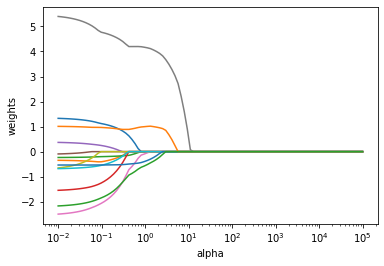

In [63]:
lasso = Lasso()
coefs = []

for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    
ax = plt.gca()
ax.plot(alphas*2, coefs)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

In [64]:
lassocv = LassoCV(alphas = None, cv = 10)
lassocv.fit(X_train, y_train)
lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)
print(mean_squared_error(y_test, lasso.predict(X_test)))
print(lassocv.alpha_)
# en iyi lasso mse değerimiz 15.1761431561867

15.1761431561867
0.0556203790632005


In [65]:
pd.Series(lasso.coef_, index=X.columns)

zn         1.102411
indus     -0.389419
chas      -0.197658
nox       -1.199310
rm         0.228789
age       -0.000000
dis       -2.009540
rad        4.745960
tax       -0.000000
ptratio   -0.523152
black     -0.531986
lstat      0.961025
medv      -1.805786
dtype: float64

In [66]:
# en iyi lasso mse değeri: 15.1761431561867

# Sonuç ve gözlemler

Bir kaç farklı yöntemle denememiz sonucu başlangıçta feature selection yaptığımızda edindiğimiz değerler, feature selection sonucu kullandığımız yeni veri setine lasso ve ridge uyguladığımız değerler, feature selection yapmadan uyguladığımız ridge ve lasso değerlerine göre daha kötüdür.

Feature selection yaptığımızda ('zn', 'chas', 'nox', 'dis', 'rad', 'tax', 'ptratio', 'medv') dışındaki değerleri atmıştık. Ancak selectionı lassoya bıraktığımızda görüyoruz ki 'age' ve 'tax' değerleri çıkartılmış. Daha iyi sonuç verdiği için age ve tax değerlerini modelimize katmayacağız.